In [0]:
from pyspark.sql.functions import col, concat, lit, to_date, countDistinct, sum, max
import matplotlib.pyplot as plt

**Dataset**
The dataset is taken from kaggle: `https://www.kaggle.com/code/jonbown/formula-1-post-race-summary/input?select=status.csv`.
First we will analyze the driver performances throughout the races. For that we have now only loaded the dataset related to the drivers. 

In [0]:
races_df = spark.read.format("csv").option("inferSchema", True)\
            .option('header', True)\
            .load("/FileStore/tables/races.csv")

drivers_df = spark.read.format("csv").option("inferSchema", True)\
            .option('header', True)\
            .load("/FileStore/tables/drivers.csv")

drivers_standing_df = spark.read.format("csv").option("inferSchema", True)\
            .option('header', True)\
            .load("/FileStore/tables/driver_standings.csv")

In [0]:
races_df.limit(5).display()
drivers_df.limit(5).display()
drivers_standing_df.limit(5).display()

raceId,year,round,circuitId,name,date,time,url,fp1_date,fp1_time,fp2_date,fp2_time,fp3_date,fp3_time,quali_date,quali_time,sprint_date,sprint_time
1,2009,1,1,Australian Grand Prix,2009-03-29,06:00:00,http://en.wikipedia.org/wiki/2009_Australian_Grand_Prix,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
2,2009,2,2,Malaysian Grand Prix,2009-04-05,09:00:00,http://en.wikipedia.org/wiki/2009_Malaysian_Grand_Prix,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
3,2009,3,17,Chinese Grand Prix,2009-04-19,07:00:00,http://en.wikipedia.org/wiki/2009_Chinese_Grand_Prix,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
4,2009,4,3,Bahrain Grand Prix,2009-04-26,12:00:00,http://en.wikipedia.org/wiki/2009_Bahrain_Grand_Prix,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
5,2009,5,4,Spanish Grand Prix,2009-05-10,12:00:00,http://en.wikipedia.org/wiki/2009_Spanish_Grand_Prix,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N


driverId,driverRef,number,code,forename,surname,dob,nationality,url
1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
2,heidfeld,\N,HEI,Nick,Heidfeld,1977-05-10,German,http://en.wikipedia.org/wiki/Nick_Heidfeld
3,rosberg,6,ROS,Nico,Rosberg,1985-06-27,German,http://en.wikipedia.org/wiki/Nico_Rosberg
4,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso
5,kovalainen,\N,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen


driverStandingsId,raceId,driverId,points,position,positionText,wins
1,18,1,10.0,1,1,1
2,18,2,8.0,2,2,0
3,18,3,6.0,3,3,0
4,18,4,5.0,4,4,0
5,18,5,4.0,5,5,0


In [0]:
print(races_df.count())
print(drivers_df.count())
print(drivers_standing_df.count())

1101
857
34124


**Dropping Unnencessary Columns**

In [0]:
print(races_df.columns)
print(drivers_df.columns)
print(drivers_standing_df.columns)

['raceId', 'year', 'round', 'circuitId', 'name', 'date', 'time', 'url', 'fp1_date', 'fp1_time', 'fp2_date', 'fp2_time', 'fp3_date', 'fp3_time', 'quali_date', 'quali_time', 'sprint_date', 'sprint_time']
['driverId', 'driverRef', 'number', 'code', 'forename', 'surname', 'dob', 'nationality', 'url']
['driverStandingsId', 'raceId', 'driverId', 'points', 'position', 'positionText', 'wins']


In [0]:
races_df = races_df.drop('url','fp1_date', 'fp1_time', 'fp2_date', 'fp2_time', 'fp3_date', 'fp3_time', 'quali_date', 'quali_time', 'sprint_date', 'sprint_time')
drivers_df = drivers_df.drop('number', 'code', 'url')
drivers_standing_df = drivers_standing_df.drop('positionText')

In [0]:
race_driver_standing_df = races_df.join(drivers_standing_df, races_df['raceId']==drivers_standing_df['raceId'], 'inner')
race_driver_standing_df.display()

raceId,year,round,circuitId,name,date,time,driverStandingsId,raceId,driverId,points,position,wins
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,18,1,10.0,1,1
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,2,18,2,8.0,2,0
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,3,18,3,6.0,3,0
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,4,18,4,5.0,4,0
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,5,18,5,4.0,5,0
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,6,18,6,3.0,6,0
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,7,18,7,2.0,7,0
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,8,18,8,1.0,8,0
19,2008,2,2,Malaysian Grand Prix,2008-03-23,07:00:00,9,19,1,14.0,1,1
19,2008,2,2,Malaysian Grand Prix,2008-03-23,07:00:00,10,19,2,11.0,3,0


In [0]:
drivers_df = race_driver_standing_df.join(drivers_df, drivers_df['driverId']==race_driver_standing_df['driverId'], 'inner')
drivers_df.display()

raceId,year,round,circuitId,name,date,time,driverStandingsId,raceId,driverId,points,position,wins,driverId,driverRef,forename,surname,dob,nationality
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,18,1,10.0,1,1,1,hamilton,Lewis,Hamilton,1985-01-07,British
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,2,18,2,8.0,2,0,2,heidfeld,Nick,Heidfeld,1977-05-10,German
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,3,18,3,6.0,3,0,3,rosberg,Nico,Rosberg,1985-06-27,German
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,4,18,4,5.0,4,0,4,alonso,Fernando,Alonso,1981-07-29,Spanish
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,5,18,5,4.0,5,0,5,kovalainen,Heikki,Kovalainen,1981-10-19,Finnish
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,6,18,6,3.0,6,0,6,nakajima,Kazuki,Nakajima,1985-01-11,Japanese
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,7,18,7,2.0,7,0,7,bourdais,Sébastien,Bourdais,1979-02-28,French
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,8,18,8,1.0,8,0,8,raikkonen,Kimi,Räikkönen,1979-10-17,Finnish
19,2008,2,2,Malaysian Grand Prix,2008-03-23,07:00:00,9,19,1,14.0,1,1,1,hamilton,Lewis,Hamilton,1985-01-07,British
19,2008,2,2,Malaysian Grand Prix,2008-03-23,07:00:00,10,19,2,11.0,3,0,2,heidfeld,Nick,Heidfeld,1977-05-10,German


In [0]:
drivers_df = drivers_df.withColumn('drivername', concat(col("forename"), lit(" "), col("surname")))
drivers_df = drivers_df.drop("driverRef", "forename", "surname")

In [0]:
drivers_df.display()

raceId,year,round,circuitId,name,date,time,driverStandingsId,raceId,driverId,points,position,wins,driverId,dob,nationality,drivername
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,18,1,10.0,1,1,1,1985-01-07,British,Lewis Hamilton
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,2,18,2,8.0,2,0,2,1977-05-10,German,Nick Heidfeld
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,3,18,3,6.0,3,0,3,1985-06-27,German,Nico Rosberg
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,4,18,4,5.0,4,0,4,1981-07-29,Spanish,Fernando Alonso
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,5,18,5,4.0,5,0,5,1981-10-19,Finnish,Heikki Kovalainen
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,6,18,6,3.0,6,0,6,1985-01-11,Japanese,Kazuki Nakajima
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,7,18,7,2.0,7,0,7,1979-02-28,French,Sébastien Bourdais
18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,8,18,8,1.0,8,0,8,1979-10-17,Finnish,Kimi Räikkönen
19,2008,2,2,Malaysian Grand Prix,2008-03-23,07:00:00,9,19,1,14.0,1,1,1,1985-01-07,British,Lewis Hamilton
19,2008,2,2,Malaysian Grand Prix,2008-03-23,07:00:00,10,19,2,11.0,3,0,2,1977-05-10,German,Nick Heidfeld


In [0]:
drivers_df.filter(col("drivername").isNull()).display()

raceId,year,round,circuitId,name,date,time,driverStandingsId,raceId,driverId,points,position,wins,driverId,dob,nationality,drivername


Out[12]: Text(0.5, 1.0, 'Top 10 Driver Count by Nations')

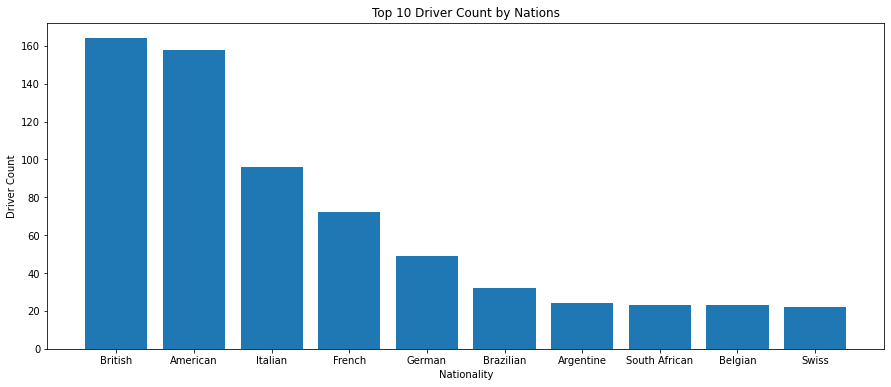

In [0]:
driver_count_by_nation = drivers_df.groupBy("nationality").agg(countDistinct("drivername").alias("distinct_driver_count"))
top_nation_driver = driver_count_by_nation.sort(col("distinct_driver_count").desc()).limit(10).toPandas()

plt.figure(figsize=(15,6))
plt.bar(top_nation_driver['nationality'], top_nation_driver['distinct_driver_count'])
plt.xlabel("Nationality")
plt.ylabel("Driver Count")
plt.title("Top 10 Driver Count by Nations")


#### Each year F1 winners

In [0]:
drivers_df.createOrReplaceTempView("driversinfo")

In [0]:
query = '''
WITH driverpoints as (
  select year, drivername, sum(points) as total_points
  from driversinfo
  group by year, drivername
),
driver_rank as (
  select year, drivername, rank() over (partition by year order by total_points desc) as rank
  from driverpoints
)

select year, drivername from driver_rank where rank = 1
'''

winners_df = spark.sql(query)
winners_df.display()

year,drivername
1950,Nino Farina
1951,Juan Fangio
1952,Alberto Ascari
1953,Alberto Ascari
1954,Juan Fangio
1955,Juan Fangio
1956,Juan Fangio
1957,Juan Fangio
1958,Stirling Moss
1959,Jack Brabham


**Who won most championship?**

In [0]:
total_winner = winners_df.groupBy("drivername").count().alias("total_win")
total_winner.sort(col("count").desc()).limit(2).display()

drivername,count
Michael Schumacher,8
Lewis Hamilton,8


## Top 10 Drivers Analysis

In [0]:
drivers = drivers_df.groupBy("drivername").agg(sum("points").alias("points"))
top_10_driver = drivers.sort(col("points").desc()).limit(10)
top_10_driver.display()

drivername,points
Lewis Hamilton,46550.5
Sebastian Vettel,32026.0
Max Verstappen,22486.5
Fernando Alonso,21692.0
Valtteri Bottas,19458.0
Kimi Räikkönen,19069.0
Nico Rosberg,16910.0
Michael Schumacher,14514.0
Sergio Pérez,13756.0
Daniel Ricciardo,13626.0


Performance throughout the years

In [0]:
top_drivers_info = drivers_df.filter(col("drivername").isin([row['drivername'] for row in top_10_driver.collect()]))
points_by_year = top_drivers_info.groupBy("year", "drivername").agg(sum("points").alias("points")).sort(col("year").asc()).toPandas()


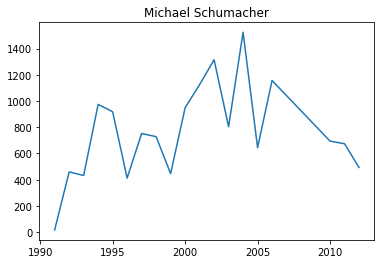

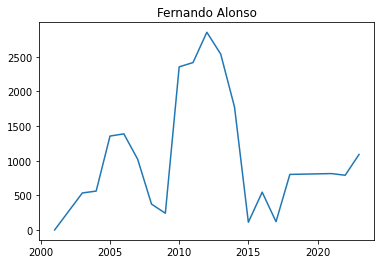

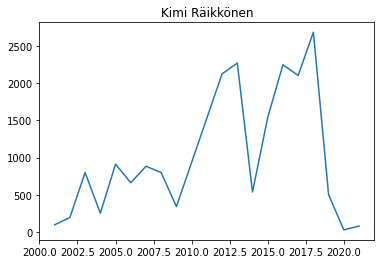

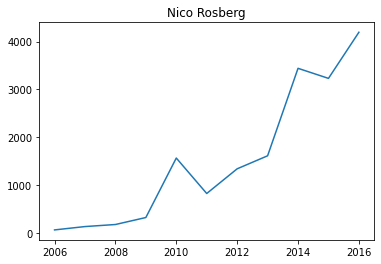

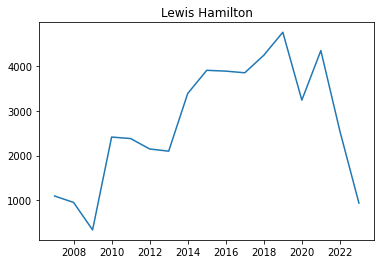

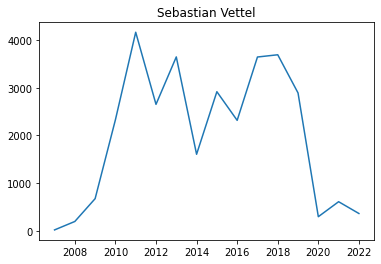

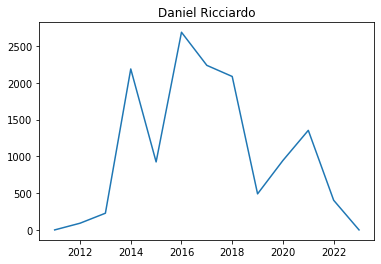

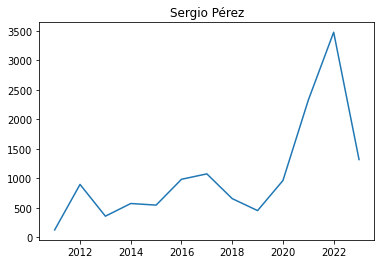

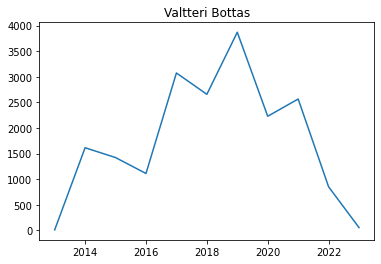

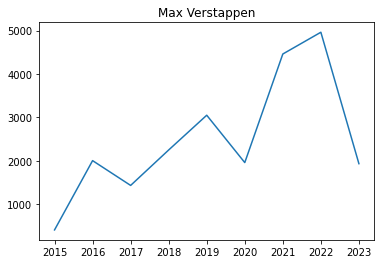

In [0]:
for driver in points_by_year['drivername'].unique():
  driver_data = points_by_year[points_by_year['drivername']==driver]
  
  plt.plot(driver_data['year'], driver_data['points'])
  plt.title(driver)
  plt.show()